## Data description

There are 3 types of input features:

    Objective: factual information;
    Examination: results of medical examination;
    Subjective: information given by the patient.

Features:

    Age | Objective Feature | age | int (days)
    Height | Objective Feature | height | int (cm) |
    Weight | Objective Feature | weight | float (kg) |
    Gender | Objective Feature | gender | categorical code | gender_map={1:'female',2:'male'}
    Systolic blood pressure | Examination Feature | ap_hi | int |
    Diastolic blood pressure | Examination Feature | ap_lo | int |
    Cholesterol | Examination Feature | cholesterol | 1: normal, 2: above normal, 3: well above normal |
    Glucose | Examination Feature | gluc | 1: normal, 2: above normal, 3: well above normal |
    Smoking | Subjective Feature | smoke | binary |
    Alcohol intake | Subjective Feature | alco | binary |
    Physical activity | Subjective Feature | active | binary |
    Presence or absence of cardiovascular disease | Target Variable | cardio | binary | 0 = no 1= yes

All of the dataset values were collected at the moment of medical examination. 

## Initial data pre-processing

In [123]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly_express as px

In [124]:
df =  pd.read_csv("./Data/cardio_train.csv", sep = ";", index_col= "id")
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,17474,1,156,56.0,100,60,1,1,0,0,0,0


From the dataset description we find out that the age is in days, which is not that convenient for me, so I will transform this into age in years. I will make a copy of the dataset for this purpose.

In [125]:
df_years = df.rename(columns = {"age": "age_days"})
df_years["age_years"] = df_years["age_days"]/365

df_years.drop(["age_days"], axis = 1, inplace = True)
df_years.head()

,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years
id,,,,,,,,,,,,
0,2,168,62.0,110,80,1,1,0,0,1,0,50.391781
1,1,156,85.0,140,90,3,1,0,0,1,1,55.419178
2,1,165,64.0,130,70,3,1,0,0,0,1,51.663014
3,2,169,82.0,150,100,1,1,0,0,1,1,48.282192
4,1,156,56.0,100,60,1,1,0,0,0,0,47.873973


Examining data for being accurate and consistent.

In [126]:
df_years.describe()

,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700,53.339358
std,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003,6.759594
min,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,29.583562
25%,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,48.394521
50%,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,53.980822
75%,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,58.430137
max,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,64.967123


* Age range is 29 - 64 years; There is some strange height and weight data, which is actually possible if studying Guinness World Records Book, but can probably cause problems with regression. So, I want to compute the **leverage statistic** for these columns; if the leverage statistic is high, I will gather this data in a separate dataset, to study them separately (will do it when analyzing BMI)

* ap_hi cannot be as high as 16020 and as low as -150. Same with ap_lo, so we'll have to clean these as well;



In [127]:
x = [(x - 165)**2 for x in df["height"]]
ss = np.sum(x)
lev = 1/70000 + (195 - 165)**2/ss
norm_lev = 2/70000
print(lev, norm_lev)

# very high leverage statistic for height 55
# создать функцию, которая собирает данные с leverage > norm_lev * 3.5 в отдельный dataset

0.00020387490820723196 2.857142857142857e-05


In [128]:
df.isna().sum()

age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

In [129]:
print (True in df.duplicated())

False


### Data Cleaning

Here I:
- have changed negative ap_hi and ap_lo to positive;
- have added "0" to the end of otherwise plausible ap_hi and ap_lo values (e.g. 12 -> 120);
- have removed ap_lo < 20 which didn't seem possible to correct by muliplying by 10;
- have removed the rows with ap_hi > 250, as I haven't found any pattern in this mistake;
- have removed the rows with ap_lo = 0;
- have removed an odd "0" from ap_lo > 200 (e.g. 1000 -> 100);
- plotted weights and heights and made a conclusion, that weights < 35 and heights <100 are not trustworthy in this dataset.


In [130]:
df.loc[:, 'ap_hi']<30

id
0        False
1        False
2        False
3        False
4        False
         ...  
99993    False
99995    False
99996    False
99998    False
99999    False
Name: ap_hi, Length: 70000, dtype: bool

In [131]:
df.loc[df.loc[:, 'ap_hi']<0, :]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
6525,15281,1,165,78.0,-100,80,2,1,0,0,1,0
22881,22108,2,161,90.0,-115,70,1,1,0,0,1,0
29313,15581,1,153,54.0,-100,70,1,1,0,0,1,0
34295,18301,1,162,74.0,-140,90,1,1,0,0,1,1
36025,14711,2,168,50.0,-120,80,2,1,0,0,0,1
50055,23325,2,168,59.0,-150,80,1,1,0,0,1,1
66571,23646,2,160,59.0,-120,80,1,1,0,0,0,0


In [132]:
df.loc[df.loc[:, 'ap_hi']<0, 'ap_hi']

id
6525    -100
22881   -115
29313   -100
34295   -140
36025   -120
50055   -150
66571   -120
Name: ap_hi, dtype: int64

In [133]:
for x in df.loc[df.loc[:, 'ap_hi']<0, 'ap_hi']:
    df.loc[df.loc[:, 'ap_hi']<0, 'ap_hi'] = abs(x)

df.loc[6525, :]


age            15281.0
gender             1.0
height           165.0
weight            78.0
ap_hi            100.0
ap_lo             80.0
cholesterol        2.0
gluc               1.0
smoke              0.0
alco               0.0
active             1.0
cardio             0.0
Name: 6525, dtype: float64

In [134]:
df.loc[df.loc[:, 'ap_hi']<25, :]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
815,21281,1,168,78.0,14,90,2,1,0,0,1,1
1294,21867,2,175,70.0,14,90,3,1,0,0,1,1
1360,18225,1,172,65.0,11,80,1,3,0,0,1,0
2260,19201,1,165,66.0,12,80,1,1,0,0,1,0
2301,22591,1,165,71.0,14,80,1,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
98039,21217,1,160,59.0,12,80,1,1,0,0,1,0
98213,18755,1,158,74.0,14,90,1,1,0,0,1,1
98568,19107,1,154,77.0,14,90,1,1,0,0,1,0


In [135]:
for x in df.loc[df.loc[:, 'ap_hi']<25, 'ap_hi']:
    df.loc[df.loc[:, 'ap_hi']<25, 'ap_hi'] = x*10

In [136]:
df.loc[df.loc[:, 'ap_hi']<60, :]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,


In [137]:
df.loc[df.loc[:, 'ap_hi']>250, :]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
2654,15116,1,160,60.0,902,60,1,1,0,0,1,0
2845,22712,2,167,59.0,906,0,1,1,0,0,1,0
6822,14425,1,168,63.0,909,60,2,1,0,0,1,0
11089,21032,1,175,80.0,11500,90,1,1,0,0,1,1
12710,18870,1,164,75.0,1420,80,2,1,0,0,1,1
13616,22659,1,155,87.0,701,110,1,1,0,0,1,1
19827,15996,1,168,72.0,1500,80,1,1,0,0,1,1
25314,22398,2,163,50.0,907,70,3,3,0,0,1,1
34120,16131,1,161,92.0,906,0,2,1,0,0,1,1


In [138]:
df.drop((df.loc[df.loc[:, 'ap_hi']>250, :]).index, inplace = True)

In [139]:
df.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,69960.000000,69960.000000,69960.000000,69960.000000,69960.000000,69960.000000,69960.000000,69960.000000,69960.000000,69960.000000,69960.000000,69960.000000
mean,19469.038265,1.349600,164.359105,74.208266,127.032747,96.647642,1.366852,1.226487,0.088179,0.053774,0.803674,0.499628
std,2467.203943,0.476847,8.210541,14.396277,17.088483,188.523437,0.680280,0.572285,0.283557,0.225572,0.397221,0.500003
min,10798.000000,1.000000,55.000000,10.000000,60.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17665.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,240.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [140]:
df.loc[df.loc[:, 'ap_lo']<0, :]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
85816,22571,1,167,74.0,140,-70,1,1,0,0,1,1


In [141]:
df.loc[df.loc[:, 'ap_lo']<0, 'ap_lo'] = 70

In [142]:
df.loc[df.loc[:, 'ap_lo']==0, :]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
19258,14965,2,150,60.0,130,0,1,1,0,0,0,0
23512,20457,1,156,50.0,138,0,3,1,0,0,1,1
24837,18226,1,164,78.0,138,0,1,1,0,0,1,0
32749,21182,2,166,68.0,149,0,1,1,0,0,1,1
36325,17952,2,176,73.0,140,0,1,1,0,0,1,0
39577,23396,2,180,73.0,140,0,1,1,1,1,1,1
54780,23208,2,170,81.0,148,0,1,1,0,0,1,0
62754,18802,1,164,78.0,108,0,2,1,0,0,1,0
65470,19597,2,165,70.0,140,0,3,1,1,0,1,0


In [143]:
df.drop((df.loc[df.loc[:, 'ap_lo']==0, :]).index, inplace = True)

In [144]:
df.loc[df.loc[:, 'ap_lo']<20, :]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
9610,16705,1,156,61.0,150,10,1,1,0,0,0,1
10843,14661,2,70,72.0,120,8,1,1,0,0,1,0
13943,21802,1,166,125.0,120,8,3,1,0,0,1,1
14410,18334,1,152,50.0,150,10,3,1,0,0,1,1
26983,17531,1,171,68.0,110,7,1,1,0,0,1,0
27242,19771,2,168,68.0,110,7,1,1,0,0,1,0
37874,18984,1,157,69.0,140,10,3,1,0,0,1,1
40122,20376,1,161,52.0,90,6,1,1,0,0,1,0
50210,20877,1,146,55.0,130,1,1,1,0,0,0,0


In [145]:
df.drop(labels = [50210, 81260, 91129], axis = 0, inplace = True)

In [146]:
for x in df.loc[df.loc[:, 'ap_lo']<20, 'ap_lo']:
    df.loc[df.loc[:, 'ap_lo']<20, 'ap_lo'] = x*10

In [147]:
df.loc[df.loc[:, 'ap_lo']>200, :]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
314,17489,2,183,98.0,160,1100,1,2,1,0,1,1
334,21932,2,157,60.0,160,1000,2,1,0,0,0,1
357,18217,1,150,83.0,140,800,1,1,0,0,1,1
458,23407,1,176,63.0,160,1000,2,2,0,0,0,1
482,18704,1,154,81.0,140,1000,2,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
99659,23330,1,167,81.0,160,1000,1,1,0,0,1,1
99798,21808,1,152,56.0,160,1000,1,1,0,0,1,1
99807,21239,2,168,95.0,160,1000,1,1,0,0,1,1


In [148]:
for x in df.loc[df.loc[:, 'ap_lo']>200, 'ap_lo']:
    df.loc[df.loc[:, 'ap_lo']>200, 'ap_lo'] = x/10

In [149]:
df.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,69943.000000,69943.000000,69943.000000,69943.000000,69943.000000,69943.000000,69943.000000,69943.000000,69943.000000,69943.000000,69943.000000,69943.000000
mean,19469.075447,1.349570,164.359221,74.208989,127.032755,81.760519,1.366870,1.226513,0.088172,0.053758,0.803669,0.499664
std,2467.122374,0.476838,8.210185,14.396889,17.088053,10.232655,0.680283,0.572306,0.283547,0.225541,0.397225,0.500003
min,10798.000000,1.000000,55.000000,10.000000,60.000000,20.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17665.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,240.000000,190.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [150]:
px.scatter(df, x = "weight", y = "height", color = "cardio", color_continuous_scale="bluered")

Weight below 35 is most likely incorrect data gathering, as well as heights below 1 m

In [151]:
df.drop((df.loc[df.loc[:, 'weight']<35, :]).index, inplace = True)

In [152]:
df.drop((df.loc[df.loc[:, 'height']<100, :]).index, inplace = True)

In [153]:
df.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000
mean,19469.161516,1.349587,164.400406,74.219657,127.035568,81.761782,1.366956,1.226572,0.088176,0.053767,0.803674,0.499714
std,2466.982884,0.476843,7.990043,14.360540,17.087656,10.231216,0.680355,0.572377,0.283553,0.225559,0.397221,0.500003
min,10798.000000,1.000000,100.000000,35.000000,60.000000,20.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17665.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,240.000000,190.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


Now the data looks much better, being more or less clean.

## Exploratory Data Analysis

In [154]:
import seaborn as sns

In [155]:
df["cardio"].value_counts()

0    34967
1    34927
Name: cardio, dtype: int64

<Axes: xlabel='cardio', ylabel='count'>

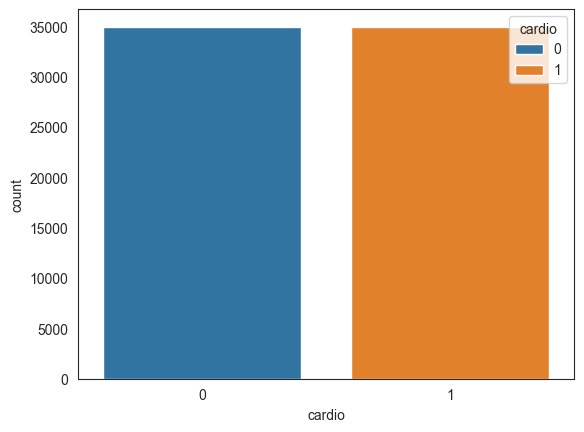

In [156]:
sns.countplot(df, x = "cardio", hue = "cardio")

The dataset looks pretty balanced.

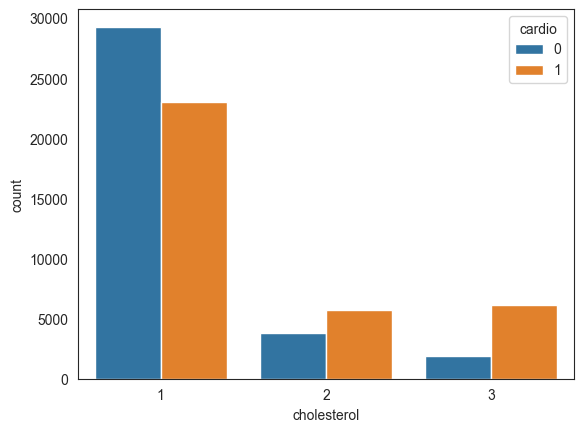

In [157]:
sns.countplot(df, x = "cholesterol", hue = "cardio")
sns.set_style('darkgrid')

In [158]:
df.query("cholesterol == 1")["cholesterol"].count()

52304

In [159]:
print (f"{df.query('cholesterol == 1')['cholesterol'].count() / df['cholesterol'].count() * 100.:1f}% of people in the database have normal cholesterol")
print (f"{df.query('cholesterol == 2')['cholesterol'].count() / df['cholesterol'].count() * 100.:1f}% of people in the database have cholesterol above normal")
print (f"{df.query('cholesterol == 3')['cholesterol'].count() / df['cholesterol'].count() * 100.:1f}% of people in the database have cholesterol which is well above normal")

74.833319% of people in the database have normal cholesterol
13.637794% of people in the database have cholesterol above normal
11.528887% of people in the database have cholesterol which is well above normal


In [160]:
df.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

<Axes: ylabel='count'>

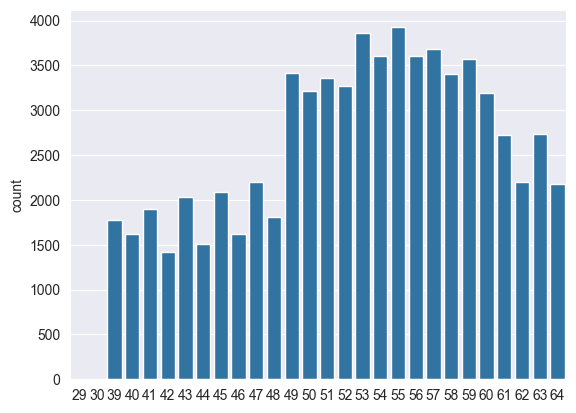

In [161]:
age = [int(value/365) for value in df["age"]]
sns.countplot(x = age)

In [162]:
print (f"The average age is {int(df['age'].mean()/365)}, with the median {int(df['age'].median()/365)} and the mode 55")

The average age is 53, with the median 53 and the mode 55


<Axes: xlabel='smoke', ylabel='count'>

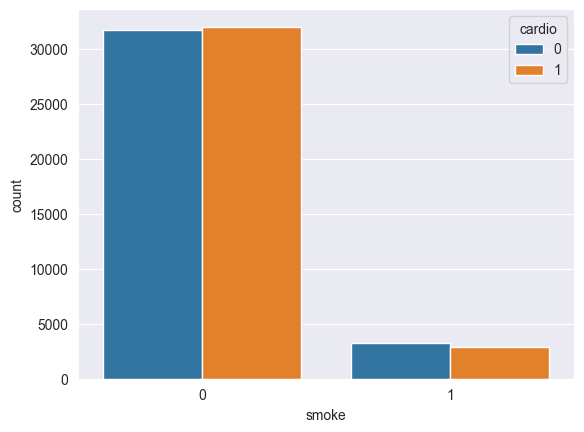

In [163]:
sns.countplot(df, x = "smoke", hue = "cardio")

In [164]:
print (f"{df.query('smoke == 1')['smoke'].count() / df['smoke'].count() * 100.:1f}% of people in the database are smokers")

8.817638% of people in the database are smokers


<Axes: xlabel='weight', ylabel='height'>

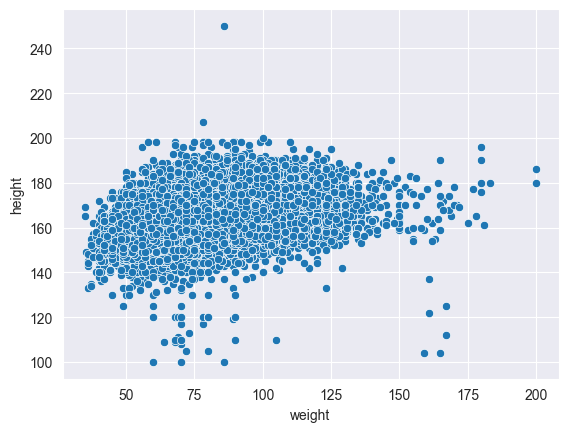

In [165]:
sns.scatterplot(df, x = "weight", y = "height")

In [166]:
df.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000,69894.000000
mean,19469.161516,1.349587,164.400406,74.219657,127.035568,81.761782,1.366956,1.226572,0.088176,0.053767,0.803674,0.499714
std,2466.982884,0.476843,7.990043,14.360540,17.087656,10.231216,0.680355,0.572377,0.283553,0.225559,0.397221,0.500003
min,10798.000000,1.000000,100.000000,35.000000,60.000000,20.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17665.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,240.000000,190.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


C:\Users\Mary\AppData\Local\Temp\ipykernel_13648\243362388.py:2: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



[Text(0, 0, 'women'), Text(1, 0, 'men')]

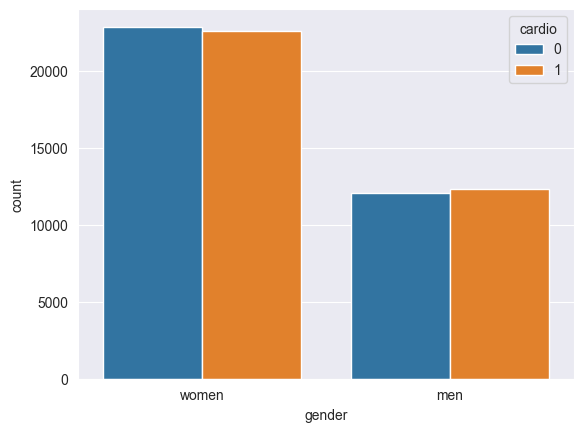

In [167]:
plot = sns.countplot(df, x = "gender", hue = "cardio")
plot.set_xticklabels(['women', 'men'])

In [168]:
print (f"The procent of women having the cardiovascular disease in the dataset (to the total number of women) is {df.query('gender == 1 and cardio ==1')['cardio'].count() / df.query('gender == 1')['cardio'].count() * 100.:1f}%")
print (f"The procent of men having the cardiovascular disease in the dataset (to the total number of men) is {df.query('gender == 2 and cardio ==1')['cardio'].count() / df.query('gender == 2')['cardio'].count() * 100.:1f}%")
print (f"Overall procent of women in the dataset is {df.query('gender == 1')['cardio'].count() / df['cardio'].count() * 100.:1f}%")

The procent of women having the cardiovascular disease in the dataset (to the total number of women) is 49.672239%
The procent of men having the cardiovascular disease in the dataset (to the total number of men) is 50.527953%
Overall procent of women in the dataset is 65.041348%


Correlation matrix

<Axes: >

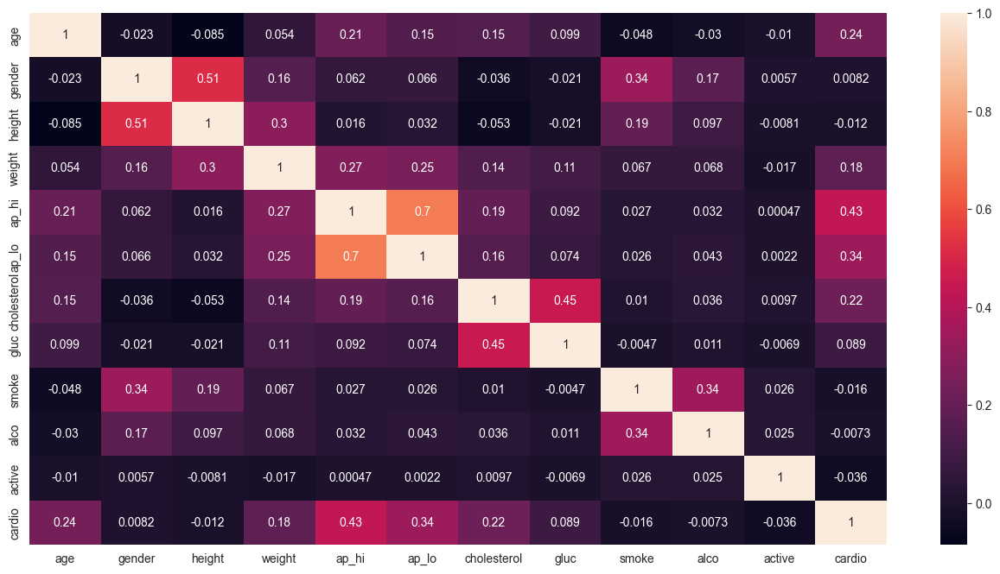

In [169]:
f, ax = plt.subplots(figsize = (16, 8))
sns.heatmap(df.corr(), annot = True)

It seems that the highest influemce on the target varible is of the following factors:
- ap_hi / ap_lo (which are highly correlated themself), with a higher influence of ap_hi (r = 0.43)
- cholesterol (0.22), and there is also an association (r = 0.45) between cholesterol and glucose levels.
- age (0.24)
- weight (0.18)

Other factors seem to be insignificant, showing week or no correlation.

### Feature Engineering

***and some further removing outliers***

The source of BMI formula and ranges: [Wikipedia](https://en.wikipedia.org/wiki/Body_mass_index)

$BMI = masskg / heightm^2$

**Category 	BMI (kg/m2)**  
Underweight (Severe thinness) 	< 16.0 	  
Underweight (Moderate thinness) 	16.0 – 16.9 	  
Underweight (Mild thinness) 	17.0 – 18.4 	  
Normal range 	18.5 – 24.9 	  
Overweight (Pre-obese) 	25.0 – 29.9 	  
Obese (Class I) 	30.0 – 34.9 	  
Obese (Class II) 	35.0 – 39.9 	  
Obese (Class III) 	≥ 40.0 	  

In [170]:
df['BMI'] = df['weight']/(df['height']/100)**2
df.sample(3)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI
id,,,,,,,,,,,,,
4228,20290,2,173,79.0,130,90.0,1,1,0,0,0,1,26.395803
32504,18953,2,169,74.0,120,80.0,1,1,0,0,1,0,25.909457
36490,21038,1,164,60.0,110,70.0,1,1,0,0,1,0,22.308150


In [171]:
px.box(df['BMI'])

Boxplot with outliers. The upper and lower fences represent values more and less than 75th and 25th percentiles (3rd and 1st quartiles), respectively, by 1.5 times the difference between the 3rd and 1st quartiles. An outlier is defined as the value above or below the upper or lower fences. 

In [172]:
df.query('BMI>60')

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI
id,,,,,,,,,,,,,
552,16718,2,165,169.0,120,80.0,1,1,0,0,1,0,62.075298
3470,23646,2,159,165.0,130,70.0,1,1,0,0,0,0,65.266406
4672,17545,1,155,155.0,160,110.0,1,1,0,0,1,1,64.516129
4825,14585,1,159,159.0,100,80.0,1,1,0,0,1,0,62.893082
4838,14516,1,100,70.0,100,70.0,1,1,0,0,1,0,70.000000
8757,20990,1,122,161.0,120,80.0,1,1,0,0,1,1,108.169847
12381,19698,2,119,89.0,160,90.0,1,1,0,0,1,1,62.848669
16062,18307,1,110,90.0,120,80.0,1,1,0,0,1,0,74.380165
17757,22077,1,137,161.0,150,100.0,2,1,0,0,0,1,85.779743


In [173]:
df.query('BMI>45')['BMI'].count()

576

By analyzing the boxplot and also a BMI chart from wikipedia, I decided to remove 38 rows with the BMI > 60 as extreme outliers.

UPD! The model training with the accuracy result 72-73% showed there are too many outliers, so removing more outliers was sufficient. The upper fence in the box plot was 39.72, but obesety class 3 is > 40, so the data >45 was removed; the lower_fence was 14.48, so the data < 14 was also removed.

In [174]:
df.drop((df.loc[df.loc[:, 'BMI']>45, :]).index, inplace = True)

In [175]:
df.drop((df.loc[df.loc[:, 'BMI']<14, :]).index, inplace = True)

In [176]:
def categorize_bmi (column):
    categories = []
    for value in column:
        if value < 18.5:
            categories.append(0) # underweight
        elif value < 25:
            categories.append(1) # normal range
        elif value < 30:
            categories.append(2) # overweight
        elif value < 35:
            categories.append(3) # obese (class 1)
        elif value < 40:
            categories.append(4) # obese (class 2)
        else:
            categories.append(5) # obese (class 3)
    return categories

In [177]:
df['BMI_categories'] = categorize_bmi(df['BMI'])

In [178]:
df.sample(5)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,BMI_categories
id,,,,,,,,,,,,,,
1665,22705,1,156,78.0,130,80.0,1,1,0,0,1,1,32.051282,3
21659,19186,1,158,64.0,120,80.0,3,3,0,0,1,1,25.636917,2
10789,19898,1,162,65.0,140,70.0,1,1,0,0,0,0,24.767566,1
89556,21345,2,164,68.0,120,80.0,1,1,0,0,1,0,25.282570,2
71533,21968,1,157,87.0,160,90.0,2,1,0,0,1,1,35.295550,4


In [179]:
df["BMI_categories"].unique()

array([1, 3, 2, 4, 0, 5], dtype=int64)

<Axes: >

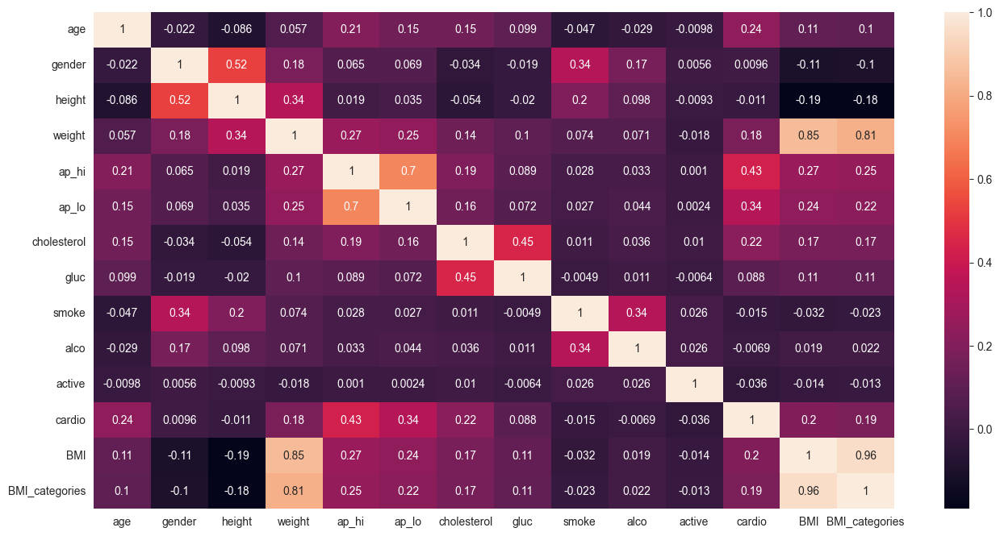

In [180]:
f, ax = plt.subplots(figsize = (16, 8))
sns.heatmap(df.corr(), annot = True)

In [181]:
px.box(df['ap_hi'])

In [182]:
px.box(df['ap_lo'])

In [183]:
df.query('(ap_hi > 200 or ap_hi < 90 or ap_lo > 105 or ap_lo < 65) and ((ap_hi - ap_lo) < 25)')

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,BMI_categories
id,,,,,,,,,,,,,,
288,18169,2,172,62.0,80,70.0,1,1,0,0,1,0,20.957274,1
681,19099,1,156,65.0,120,150.0,2,1,0,0,1,0,26.709402,2
913,20457,2,169,68.0,70,110.0,1,1,0,0,1,0,23.808690,1
1803,23578,2,169,86.0,130,110.0,1,1,0,0,1,1,30.110991,3
3356,23361,1,154,102.0,90,150.0,1,1,0,0,0,1,43.008939,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98104,16853,2,164,72.0,80,60.0,1,1,1,0,0,0,26.769780,2
98932,15207,1,165,47.0,80,60.0,2,1,0,0,1,0,17.263545,0
99006,21059,2,168,63.0,120,110.0,1,1,0,0,0,0,22.321429,1


I have discovered that therre are some very unlikely differences b/w systolic and diastolic pressures, and this, actually can also a factor which allows predict whether the person has a cardio disease or not.

In [184]:
df['ap_difference'] = df['ap_hi'] - df['ap_lo']
df.sample(5)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,BMI_categories,ap_difference
id,,,,,,,,,,,,,,,
6365,19601,2,168,68.0,120,80.0,1,1,0,0,1,0,24.092971,1,40.0
70846,16736,1,158,69.0,120,80.0,1,2,0,0,1,0,27.639801,2,40.0
21839,18369,2,168,65.0,120,80.0,1,1,0,0,1,0,23.030045,1,40.0
60696,20273,1,163,72.0,140,90.0,1,1,0,0,1,1,27.099251,2,50.0
37440,20260,1,168,85.0,110,70.0,1,1,0,0,1,0,30.116213,3,40.0


In [185]:
px.box(df['ap_difference'])

In [186]:
df.query('ap_difference < 20')

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,BMI_categories,ap_difference
id,,,,,,,,,,,,,,,
288,18169,2,172,62.0,80,70.0,1,1,0,0,1,0,20.957274,1,10.0
681,19099,1,156,65.0,120,150.0,2,1,0,0,1,0,26.709402,2,-30.0
913,20457,2,169,68.0,70,110.0,1,1,0,0,1,0,23.808690,1,-40.0
3356,23361,1,154,102.0,90,150.0,1,1,0,0,0,1,43.008939,5,-60.0
3373,19752,1,162,58.0,110,100.0,2,1,0,0,1,0,22.100290,1,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96865,16791,1,157,74.0,100,90.0,2,1,0,0,1,1,30.021502,3,10.0
97151,21701,1,154,64.0,85,66.0,1,1,0,1,1,0,26.986001,2,19.0
97210,18421,1,152,65.0,80,120.0,1,1,0,0,1,0,28.133657,2,-40.0


In [187]:
df.drop((df.loc[df.loc[:, 'ap_difference']<20, :]).index, inplace = True)

In [188]:
df.drop((df.loc[df.loc[:, 'ap_difference']>90, :]).index, inplace = True)

In [189]:
df.query('(ap_hi < 90 or ap_lo > 135 or ap_lo < 55)')

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,BMI_categories,ap_difference
id,,,,,,,,,,,,,,,
543,19517,1,147,41.0,80,50.0,1,1,0,0,1,0,18.973576,1,30.0
2769,17458,1,155,50.0,90,50.0,1,1,0,0,1,0,20.811655,1,40.0
3082,22704,2,174,65.0,110,50.0,1,1,1,0,1,1,21.469150,1,60.0
4603,20335,1,160,76.0,100,50.0,1,1,0,0,1,1,29.687500,2,50.0
5428,19644,2,173,58.0,80,60.0,1,1,1,0,1,0,19.379197,1,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97608,21909,1,151,80.0,130,50.0,2,2,0,0,1,0,35.086180,4,80.0
97651,19066,2,159,68.0,100,50.0,2,1,1,0,1,0,26.897670,2,50.0
97768,15370,2,179,100.0,200,140.0,1,2,1,0,1,1,31.210012,3,60.0


In [190]:
df.drop((df.loc[df.loc[:, 'ap_hi']<90, :]).index, inplace = True)
df.drop((df.loc[df.loc[:, 'ap_lo']>130, :]).index, inplace = True)
df.drop((df.loc[df.loc[:, 'ap_lo']<55, :]).index, inplace = True)

In [191]:
df.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,BMI_categories,ap_difference
count,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000
mean,19467.943827,1.351145,164.481108,73.821266,126.868450,81.652611,1.363827,1.223788,0.088234,0.053377,0.804007,0.497561,27.312562,1.967298,45.215838
std,2467.352773,0.477332,7.833590,13.557299,16.413227,9.725984,0.678232,0.569415,0.283637,0.224786,0.396966,0.499998,4.860545,0.999858,11.106757
min,10798.000000,1.000000,120.000000,35.450000,90.000000,55.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,14.479500,0.000000,20.000000
25%,17663.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,23.875115,1.000000,40.000000
50%,19702.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,26.298488,2.000000,40.000000
75%,21326.000000,2.000000,170.000000,82.000000,140.000000,90.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,30.103806,3.000000,50.000000
max,23713.000000,2.000000,207.000000,149.000000,220.000000,130.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,44.997166,5.000000,90.000000


<Axes: >

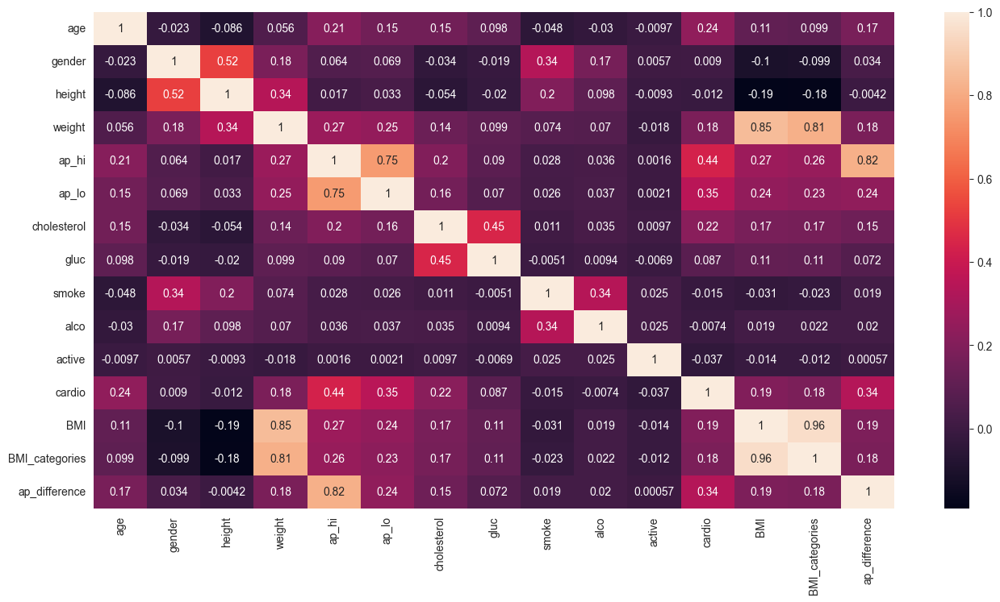

In [192]:
f, ax = plt.subplots(figsize = (16, 8))
sns.heatmap(df.corr(), annot = True)

As expected, there is some correlation b/w systolic/diastopic difference and cardio disease

***Five categories define blood pressure readings for adults***:

    1, Healthy: A healthy blood pressure reading is less than 120/80 millimeters of mercury (mm Hg).  
    2, Elevated: The systolic number is between 120 and 129 mm Hg, and the diastolic number is less than 80 mm Hg. Doctors usually don’t treat elevated blood pressure with medication.
    3, Stage 1 hypertension: The systolic number is between 130 and 139 mm Hg, or the diastolic number is between 80 and 89 mm Hg.  
    4, Stage 2 hypertension: The systolic number is 140 mm Hg or higher, or the diastolic number is 90 mm Hg or higher.  
    5, Hypertensive crisis: The systolic number is over 180 mm Hg, or the diastolic number is over 120 mm Hg. Blood pressure in this range requires urgent medical attention. 

In [193]:
def categorize_blpressure(ap_hi, ap_lo):
    category = []
    for value in zip(ap_hi, ap_lo):

        if (value[0] >= 180) or (value[1] > 120):
            category.append(5) # hypertension crisis 
        elif (value[0] >= 140 and value[0] < 180) or (value[1]>= 90 and value[1] < 120):
            category.append(4) # stage 2 hypertension
        elif (value[0] >= 130 and value [0] < 140) or (value [1] > 80 and value [1] < 90):
            category.append(3) # stage 1 hypertension
        elif value[0] > 120 and value [0] < 130 and value [1] <= 80:
            category.append(2) # elevated
        elif value[0] <= 120 and value[1] <= 80:
            category.append(1) # healthy       
        else:
            category.append(-1)
    return category


In [194]:
df ['blood pressure range'] = categorize_blpressure(df['ap_hi'], df['ap_lo'])

In [195]:
df.sample(5)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,BMI_categories,ap_difference,blood pressure range
id,,,,,,,,,,,,,,,,
6833,20461,1,167,75.0,120,80.0,1,1,0,0,0,1,26.892323,2,40.0,1
30563,16176,1,157,55.0,120,80.0,1,1,0,0,1,0,22.313278,1,40.0,1
26452,20442,2,163,77.0,160,90.0,1,1,0,0,1,0,28.981143,2,70.0,4
34258,23293,1,156,56.0,120,80.0,1,1,0,0,1,1,23.011177,1,40.0,1
43372,21290,2,182,72.0,140,90.0,1,1,0,0,1,1,21.736505,1,50.0,4


In [196]:
df['blood pressure range'].unique()

array([1, 4, 3, 5, 2], dtype=int64)

In [197]:
df['blood pressure range'].value_counts()

1    38580
4    23153
3     5737
5      800
2      411
Name: blood pressure range, dtype: int64

<Axes: xlabel='cardio', ylabel='count'>

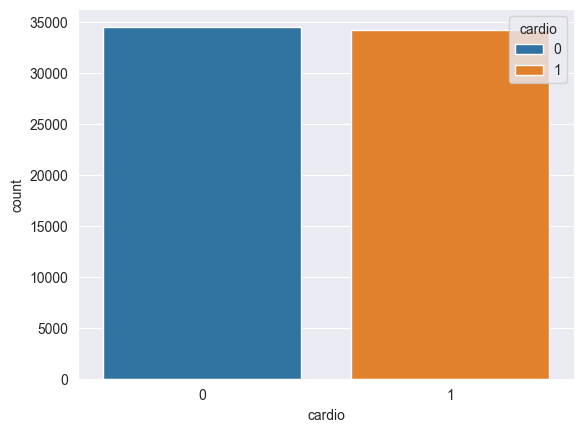

In [198]:
sns.countplot(df, x = "cardio", hue = "cardio")

The dataset is still pretty balanced, but now it is much more trustworthy.

<Axes: >

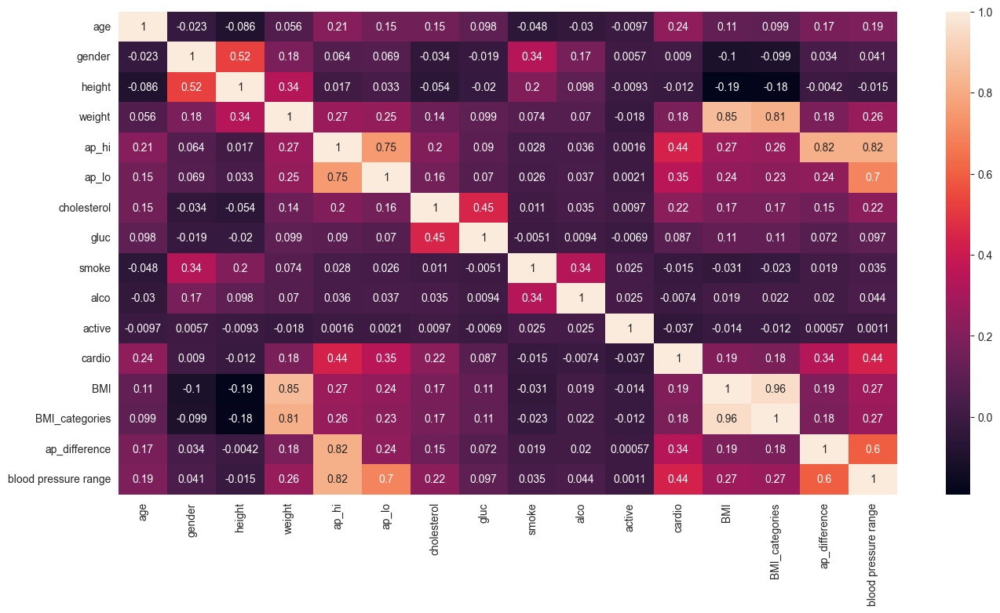

In [199]:
f, ax = plt.subplots(figsize = (16, 8))
sns.heatmap(df.corr(), annot = True)

### Creating two datasets

In [200]:
df.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio', 'BMI', 'BMI_categories',
       'ap_difference', 'blood pressure range'],
      dtype='object')

In [201]:
df_categorial = df.drop(["ap_hi", "ap_lo", "height", "weight", "BMI", "ap_difference"], axis = 1)
df_categorial = pd.get_dummies(data = df_categorial, columns = ["gender", "BMI_categories", "blood pressure range"])
df_categorial.sample()

,age,cholesterol,gluc,smoke,alco,active,cardio,gender_1,gender_2,BMI_categories_0,BMI_categories_1,BMI_categories_2,BMI_categories_3,BMI_categories_4,BMI_categories_5,blood pressure range_1,blood pressure range_2,blood pressure range_3,blood pressure range_4,blood pressure range_5
id,,,,,,,,,,,,,,,,,,,,
99392,21236,1,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0


In [202]:
df_bmi = df.drop(["BMI_categories", "blood pressure range", "height", "weight", "ap_difference"], axis = 1)
df_bmi = pd.get_dummies(data = df_bmi, columns=["gender"], drop_first=True)
df_bmi.sample()

,age,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,gender_2
id,,,,,,,,,,,
5083,18923,150,90.0,1,2,0,0,0,0,20.65754,1


In [203]:
df_bmi.describe()

,age,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,gender_2
count,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000,68681.000000
mean,19467.943827,126.868450,81.652611,1.363827,1.223788,0.088234,0.053377,0.804007,0.497561,27.312562,0.351145
std,2467.352773,16.413227,9.725984,0.678232,0.569415,0.283637,0.224786,0.396966,0.499998,4.860545,0.477332
min,10798.000000,90.000000,55.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,14.479500,0.000000
25%,17663.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,23.875115,0.000000
50%,19702.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,26.298488,0.000000
75%,21326.000000,140.000000,90.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,30.103806,1.000000
max,23713.000000,220.000000,130.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,44.997166,1.000000


In [204]:
#df_categorial.to_csv('./Data/categorial_clean_cardio.csv')

In [205]:
#df_bmi.to_csv('./Data/bmi_clean_cardio.csv')

In [206]:
#sns.pairplot(df_categorial[["cardio", "age", "cholesterol", "BMI_categories", "blood pressure range"]], hue = "cardio", corner = True)

In [207]:
#sns.pairplot(df_bmi[["cardio", "age", "cholesterol", "BMI", "ap_difference"]], hue = "cardio", corner = True)

## Model training 

In [208]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline

In [209]:
train_categorial, test_categorial = train_test_split(df_categorial, test_size = 100, random_state = 27)
train_bmi, test_bmi = train_test_split(df_bmi, test_size = 100, random_state= 27)

In [267]:
#train_bmi.to_csv('./Data/train_bmi.csv')

In [268]:
#test_bmi.to_csv('./Data/test_samples.csv')

In [210]:
X_final_test_cat, y_final_test_cat = test_categorial.drop("cardio", axis = 1), test_categorial["cardio"]
X_final_test_b, y_final_test_b = test_bmi.drop("cardio", axis = 1), test_bmi["cardio"]

X_final_train_cat, y_final_train_cat = train_categorial.drop("cardio", axis = 1), train_categorial["cardio"]
X_final_train_b, y_final_train_b = train_bmi.drop("cardio", axis = 1), train_bmi["cardio"]

Then we have a further split of train data, for having "honest" learning process

In [211]:
Xcat, ycat = train_categorial.drop("cardio", axis = 1), train_categorial["cardio"]
Xcat_train, Xcat_test, ycat_train, ycat_test = train_test_split(Xcat, ycat, test_size = 0.33, random_state = 27)

In [212]:
Xb, yb = train_bmi.drop("cardio", axis = 1), train_bmi["cardio"]
Xb_train, Xb_test, yb_train, yb_test = train_test_split(Xb, yb, test_size = 0.33, random_state = 27)

In [213]:
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay, classification_report
from sklearn.preprocessing import StandardScaler

In [214]:
cat_scaler = StandardScaler()
scaled_Xcat_train = cat_scaler.fit_transform(Xcat_train)
scaled_Xcat_test = cat_scaler.transform(Xcat_test)

final_scaler_cat = StandardScaler()
scaled_final_Xcat_train = final_scaler_cat.fit_transform(X_final_train_cat)
scaled_final_Xcat_test = final_scaler_cat.transform(X_final_test_cat)

final_scaler_b = StandardScaler()
scaled_final_Xb_train = final_scaler_b.fit_transform(X_final_train_b)
scaled_final_Xb_test = final_scaler_b.transform(X_final_test_b)

b_scaler = StandardScaler()
scaled_Xb_train = b_scaler.fit_transform(Xb_train)
scaled_Xb_test = b_scaler.transform(Xb_test)

### Logistic Regression

**categorial dataset**

In [215]:
from sklearn.linear_model import LogisticRegression
logistic_regression_cat = LogisticRegression()


In [216]:
logistic_regression_cat.fit(Xcat_train, ycat_train)

c:\Users\Mary\.virtualenvs\GitHub-ARbJjTr-\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [217]:
ycat_pred = logistic_regression_cat.predict(Xcat_test)

Accuracy: 0.723


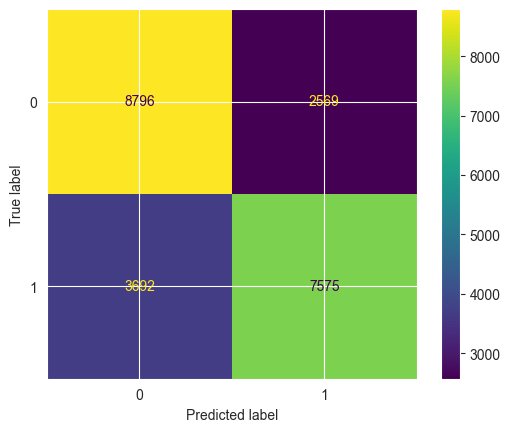

In [218]:
acc = accuracy_score (ycat_test, ycat_pred)
print (f"Accuracy: {acc:.3f}")

cm = confusion_matrix (ycat_test, ycat_pred, labels = logistic_regression_cat.classes_)
disp = ConfusionMatrixDisplay(cm, display_labels = logistic_regression_cat.classes_)
disp.plot()
sns.set_style('white')

In [219]:
print(classification_report(ycat_test, ycat_pred))

              precision    recall  f1-score   support

           0       0.70      0.77      0.74     11365
           1       0.75      0.67      0.71     11267

    accuracy                           0.72     22632
   macro avg       0.73      0.72      0.72     22632
weighted avg       0.73      0.72      0.72     22632



In [220]:
logistic_regression_cat2 = LogisticRegression()
logistic_regression_cat2.fit(scaled_Xcat_train, ycat_train)
ycat_pred = logistic_regression_cat2.predict(scaled_Xcat_test)
print(classification_report(ycat_test, ycat_pred))

In [221]:
logistic_regression_b = LogisticRegression()
logistic_regression_b.fit(Xb_train, yb_train)
yb_pred = logistic_regression_b.predict(Xb_test)
print(classification_report(yb_test, yb_pred))

In [222]:
logistic_regression_b2 = LogisticRegression()
logistic_regression_b2.fit(scaled_Xb_train, yb_train)
yb_pred = logistic_regression_b2.predict(scaled_Xb_test)
print(classification_report(yb_test, yb_pred))


In [269]:
scaler = StandardScaler()
pipe_log_reg = Pipeline([("scaler", scaler), ("log", LogisticRegression(solver = "saga", multi_class = "auto", 
                                                                        max_iter = 10000, penalty = "elasticnet"))])
l1_ratio = np.linspace(0, 1, 10)
param_grid_log_reg = {"log__l1_ratio": l1_ratio}
final_model_lgr = GridSearchCV(estimator = pipe_log_reg, param_grid = param_grid_log_reg, 
                                  scoring = "balanced_accuracy", verbose = 5, n_jobs = 4)



In [224]:
final_model_lgr.fit(scaled_Xcat_train, ycat_train)
ycat_pred = final_model_lgr.predict(scaled_Xcat_test)
print(classification_report(ycat_test, ycat_pred))

In [226]:
final_model_lgr.fit(scaled_Xb_train, yb_train)
yb_pred = final_model_lgr.predict(scaled_Xb_test)
print(classification_report(yb_test, yb_pred))

Fitting 5 folds for each of 10 candidates, totalling 50 fits


              precision    recall  f1-score   support

           0       0.71      0.79      0.74     11365
           1       0.76      0.67      0.71     11267

    accuracy                           0.73     22632
   macro avg       0.73      0.73      0.73     22632
weighted avg       0.73      0.73      0.73     22632



In [242]:
print(final_model_lgr.best_estimator_)

Pipeline(steps=[('scaler', StandardScaler()),
                ('log',
                 LogisticRegression(l1_ratio=0.4444444444444444, max_iter=10000,
                                    penalty='elasticnet', solver='saga'))])


In [265]:
print(final_model_lgr.best_params_)

{'log__l1_ratio': 0.4444444444444444}


In [270]:
final_model_lgr.fit(scaled_final_Xb_train, y_final_train_b)
yb_pred = final_model_lgr.predict(scaled_final_Xb_test)
print(classification_report(y_final_test_b, yb_pred))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.79      0.78      0.78        49
           1       0.79      0.80      0.80        51

    accuracy                           0.79       100
   macro avg       0.79      0.79      0.79       100
weighted avg       0.79      0.79      0.79       100



In [1]:
from joblib import dump

In [274]:
#dump(final_model_lgr, './model_lgr.pkl')

['./model_lgr.pkl']

Accuracy: 0.790


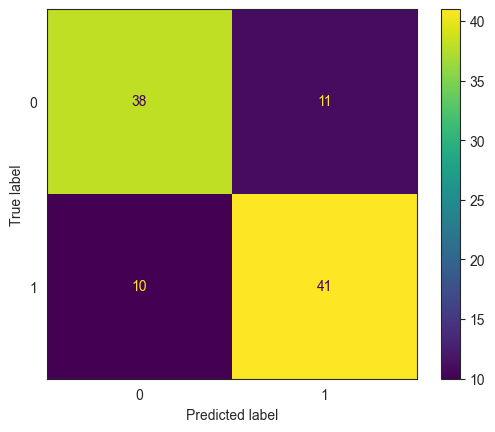

In [271]:
acc = accuracy_score (y_final_test_b, yb_pred)
print (f"Accuracy: {acc:.3f}")

sns.set_style('white')
cm = confusion_matrix (y_final_test_b, yb_pred, labels = final_model_lgr.classes_)
disp = ConfusionMatrixDisplay(cm, display_labels = final_model_lgr.classes_)
disp.plot()


In [272]:
print(final_model_lgr.best_estimator_)

Pipeline(steps=[('scaler', StandardScaler()),
                ('log',
                 LogisticRegression(l1_ratio=0.8888888888888888, max_iter=10000,
                                    penalty='elasticnet', solver='saga'))])


## SVM

In [229]:
from sklearn.svm import SVC

In [230]:
svc_cat = SVC()
svc_cat.fit (scaled_Xcat_train, ycat_train)
predictions = svc_cat.predict(scaled_Xcat_test)
print(classification_report(ycat_test, predictions))

In [231]:
svc_b = SVC()
svc_b.fit (scaled_Xb_train, yb_train)
predictions = svc_b.predict(scaled_Xb_test)
print(classification_report(yb_test, predictions))

In [232]:
param_grid_svc = {
    'C': [0.1, 1, 10],
    'gamma': [1, 0.1, 0.01],
    'kernel': ['rbf']
    }

grid_svc = GridSearchCV(SVC(), param_grid_svc, refit = True, verbose = 5)

grid_svc.fit(scaled_Xcat_train, ycat_train)
predictions = grid_svc.predict(scaled_Xcat_test)
print(classification_report(ycat_test, predictions))

In [233]:
param_grid_svc = {
    'C': [0.1, 1, 10],
    'gamma': [1, 0.1, 0.01],
    'kernel': ['rbf']
    }

grid_svc = GridSearchCV(SVC(), param_grid_svc, refit = True, verbose = 5, n_jobs = 4)

grid_svc.fit(scaled_Xb_train, yb_train)
predictions = grid_svc.predict(scaled_Xb_test)
print(classification_report(yb_test, predictions))

## Random Forest

In [234]:
from sklearn.ensemble import RandomForestClassifier

In [235]:
model_rf_cat = RandomForestClassifier(random_state = 27)
model_rf_cat.fit(Xcat_train, ycat_train)
predictions = model_rf_cat.predict(Xcat_test)
print(classification_report(ycat_test, predictions))

In [236]:
model_rf_catsc = RandomForestClassifier(random_state = 27)
model_rf_catsc.fit(scaled_Xcat_train, ycat_train)
predictions = model_rf_catsc.predict(scaled_Xcat_test)
print(classification_report(ycat_test, predictions))

In [237]:
model_rf_b = RandomForestClassifier(random_state = 27)
model_rf_b.fit(Xb_train, yb_train)
predictions = model_rf_cat.predict(Xb_test)
print(classification_report(yb_test, predictions))

In [238]:
model_rf_bsc = RandomForestClassifier(random_state = 27)
model_rf_bsc.fit(scaled_Xb_train, yb_train)
predictions = model_rf_bsc.predict(scaled_Xb_test)
print(classification_report(yb_test, predictions))

In [239]:
param_grid = {"n_estimators": [100, 150, 200,
                               300], "criterion": ["gini", "entropy"], "max_features": ["auto","sqrt", "log2"]}
grid_rf = GridSearchCV(RandomForestClassifier(), param_grid,
                   refit = True, verbose=5, n_jobs = 4)

In [240]:
grid_rf.fit(scaled_Xb_train, yb_train)
predictions = grid_rf.predict(scaled_Xb_test)
print(classification_report(yb_test, predictions))

## AdaBoost

In [241]:
from sklearn.ensemble import AdaBoostClassifier

model_ada = AdaBoostClassifier(n_estimators = 50)
model_ada.fit(scaled_Xb_train, yb_train)

predictions = model_ada.predict(scaled_Xb_test)
print(classification_report(yb_test, predictions))

c:\Users\Mary\.virtualenvs\GitHub-ARbJjTr-\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



              precision    recall  f1-score   support

           0       0.71      0.80      0.75     11365
           1       0.77      0.66      0.71     11267

    accuracy                           0.73     22632
   macro avg       0.74      0.73      0.73     22632
weighted avg       0.74      0.73      0.73     22632



## Naive Bayes

In [254]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(scaled_Xcat_train, ycat_train)
predictions = model.predict(scaled_Xcat_test)
print(classification_report(ycat_test, predictions))

              precision    recall  f1-score   support

           0       0.70      0.76      0.73     11365
           1       0.73      0.67      0.70     11267

    accuracy                           0.71     22632
   macro avg       0.71      0.71      0.71     22632
weighted avg       0.71      0.71      0.71     22632



## KNN

In [259]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=99)

model.fit(scaled_Xb_train, yb_train)
predictions = model.predict(scaled_Xb_test)
print(classification_report(yb_test, predictions))

              precision    recall  f1-score   support

           0       0.72      0.78      0.74     11365
           1       0.75      0.69      0.72     11267

    accuracy                           0.73     22632
   macro avg       0.73      0.73      0.73     22632
weighted avg       0.73      0.73      0.73     22632



In [264]:
n = np.arange(5, 250, 10)

param_grid_svc = {
    'n_neighbors': n,
        }

grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid_svc, refit = True, verbose = 5)

grid_knn.fit(scaled_Xb_train, yb_train)
predictions = grid_knn.predict(scaled_Xb_test)
print(classification_report(yb_test, predictions))

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .....................n_neighbors=5;, score=0.693 total time=   2.0s
[CV 2/5] END .....................n_neighbors=5;, score=0.700 total time=   1.7s
[CV 3/5] END .....................n_neighbors=5;, score=0.701 total time=   1.7s
[CV 4/5] END .....................n_neighbors=5;, score=0.698 total time=   1.6s
[CV 5/5] END .....................n_neighbors=5;, score=0.696 total time=   1.8s
[CV 1/5] END ....................n_neighbors=15;, score=0.720 total time=   2.2s
[CV 2/5] END ....................n_neighbors=15;, score=0.726 total time=   2.2s
[CV 3/5] END ....................n_neighbors=15;, score=0.722 total time=   2.3s
[CV 4/5] END ....................n_neighbors=15;, score=0.723 total time=   2.2s
[CV 5/5] END ....................n_neighbors=15;, score=0.715 total time=   2.4s
[CV 1/5] END ....................n_neighbors=25;, score=0.728 total time=   2.5s
[CV 2/5] END ....................n_neighbors=25